<a href="https://colab.research.google.com/github/pejmanrasti/From_Shallow_to_Deep/blob/main/4_Time_Series_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## Specific concepts that will be covered:
In the process, we will build practical experience and develop intuition around the concepts Convolutional Neural Network and Recurrent Neural Network



## We will follow the general machine learning workflow:

1. Examine and understand data
2. Build an input pipeline
3. Build our models
4. Train our models
5. Test our models
6. Improve our model/Repeat the process

<hr>

**Before you begin**

Before running the code in this notebook, reset the runtime by going to **Kernel -> Restart & clear output** in the menu above. If you have been working through several notebooks, this will help you avoid reaching memory limits.


## IMPORT LIBRARIES

Let's start by importing required packages:

*   os — to read files and directory structure
*   numpy — for some matrix math outside of TensorFlow
*   matplotlib.pyplot — to plot the graph and display images in our training and validation data

In [ ]:
!pip install 'h5py<3.0.0'
! pip install livelossplot
!pip install tensorboardcolab
import os
os.kill(os.getpid(), 9)

In [ ]:
%tensorflow_version 1.x
from __future__ import absolute_import, division, print_function, unicode_literals

TensorFlow 1.x selected.


In [ ]:
#importing Necessarily libraries

import numpy as np   # Package for scientific computing
import matplotlib.pyplot as plt # 2D plotting library
import os     # Using operating system
import cv2    # Computer vision and machine learning software library
from tqdm import tqdm   # Progress bar library
import random  # Generating Random Numbers
import pickle # Serializing and de-serializing a Python object structure
from os.path import join as pj # for path ops
import time
from livelossplot import PlotLossesKeras
import natsort # Sorting the data

# Tensorflow libraries to make CNN and RNN models
from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten,LSTM, Lambda,concatenate, TimeDistributed,GRU, BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPooling2D, TimeDistributed
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping
from tensorflow.keras import Input, Model
import tensorflow as tf
from tensorflow.keras import backend as K


## IMAGES AND LABELS LOADING FROM LOCAL/GOOGLE DRIVE

To build our image classifier, we begin by loading the dataset. The dataset we are using is consists of four classes of soil, the first appearance of cotyledons (FA), opening of cotyledons (OC), and appearance of the first leaf (FL).

In this notebook, we will make connection to the google drive which will read data from there. We therefore need to directly of data.

We'll now assign variables with the proper file path for the training and validation sets.

In [ ]:
from google.colab import drive
root = '/content/gdrive/'
drive.mount( root )

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [ ]:
# create permanent directory in gdrive
data_dir_path = r'/My Drive/FormationUA/'
os.makedirs(root+data_dir_path, exist_ok=True)
os.listdir(root+data_dir_path)

['data.zip']

In [ ]:
!unzip -q "/content/gdrive/My Drive/FormationUA/data.zip"

replace data/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
ls data/

images/  pot_1.gif


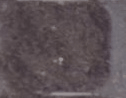

In [ ]:
from IPython.display import Image
Image(open('data/pot_1.gif','rb').read())

In [ ]:
base_dir = 'data/images'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

In [ ]:
train_soil_dir = os.path.join(train_dir, 'soil')  # directory with our training soil pictures
train_FA_dir = os.path.join(train_dir, 'FA')  # directory with our training FA pictures
train_OC_dir = os.path.join(train_dir, 'OC')  # directory with our training OC pictures
train_FL_dir = os.path.join(train_dir, 'FL')  # directory with our training FL pictures


validation_soil_dir = os.path.join(validation_dir, 'soil')  # directory with our validation soil pictures
validation_OC_dir = os.path.join(validation_dir, 'OC')  # directory with our validation OC pictures
validation_FA_dir = os.path.join(validation_dir, 'FA')  # directory with our validation FA pictures
validation_FL_dir = os.path.join(validation_dir, 'FL')  # directory with our validation FL pictures


### Understanding our data

Let's look at how many plants and weeds images we have in our training and validation directory

In [ ]:
num_soil_tr = len(os.listdir(train_soil_dir))
num_FA_tr = len(os.listdir(train_FA_dir))
num_OC_tr = len(os.listdir(train_OC_dir))
num_FL_tr = len(os.listdir(train_FL_dir))

num_soil_val = len(os.listdir(validation_soil_dir))
num_FA_val = len(os.listdir(validation_FA_dir))
num_OC_val = len(os.listdir(validation_OC_dir))
num_FL_val = len(os.listdir(validation_FL_dir))


total_train = num_soil_tr + num_FA_tr + num_OC_tr + num_FL_tr
total_val = num_soil_val + num_FA_val +num_OC_val + num_FL_val

In [ ]:
print('total training soil images:', num_soil_tr)
print('total training FA images:', num_FA_tr)
print('total training OC images:', num_OC_tr)
print('total training FL images:', num_FL_tr)

print('total validation soil images:', num_soil_val)
print('total validation FA images:', num_FA_val)
print('total validation OC images:', num_OC_val)
print('total validation FL images:', num_FL_val)

print("--")
print("Total training images:", total_train)
print("Total validation images:", total_val)

total training soil images: 601
total training FA images: 121
total training OC images: 466
total training FL images: 631
total validation soil images: 456
total validation FA images: 112
total validation OC images: 376
total validation FL images: 544
--
Total training images: 1819
Total validation images: 1488


### Reading Data

Here, we read and have applied normalization to our training images.

In [ ]:
IMG_SIZE_H=89 # you need to set up a numerical value here. Useful to resize to normalize data size
IMG_SIZE_W=89 # you need to set up a numerical value here. Useful to resize to normalize data size
def read_data(DATADIR):
  input_data = []
  CATEGORIES = ['soil', 'FA', 'OC', 'FL'] 
  for category in CATEGORIES:  # do plants and weeds

      path = os.path.join(DATADIR,category)  # create path to the labels
      class_num = CATEGORIES.index(category)  # get the classification  (0 or a 1). 0=plants 1=weeds

      for img in tqdm(os.listdir(path)):  # iterate over each image per plants and weeds
      
          if '.jpg' in img:
            img_array = cv2.imread(os.path.join(path,img))  # convert to array 
            new_array = cv2.resize(img_array, (IMG_SIZE_H, IMG_SIZE_W))  # resize to normalize data size
            
            hsv = cv2.cvtColor(new_array, cv2.COLOR_BGR2HSV)
            mask = cv2.inRange(hsv, (25, 0, 0), (56, 255,255))
            ## slice the green
            imask = mask>0
            green = np.zeros_like(new_array, np.uint8)
            green[imask] = new_array[imask]


            input_data.append([green, class_num])  # add this to our training_data
  
  
  return input_data

In [ ]:
training_data = read_data(train_dir)  # Calling the function for reading Training images and labels
Validation_data = read_data(validation_dir)  # Calling the function for reading Training images and labels

100%|██████████| 544/544 [00:00<00:00, 2137.79it/s]


### Preparation of data to feed into a CNN model


In [ ]:
random.shuffle(training_data)   # Shuffling data 
random.shuffle(Validation_data)   # Shuffling data 
X = []  # An Array for Training images
y = []  # An Array for Training labels
X_val = []  # An Array for Validation images
y_val = []  # An Array for Validation labels

for features,label in training_data:   # Seperation of iamegs and labels
    X.append(features)
    y.append(label)

print("Total training images:",np.array(X).shape) # Print the size of the database

for features,label in Validation_data:   # Seperation of iamegs and labels
    X_val.append(features)
    y_val.append(label)
print("Total validation images:", np.array(X_val).shape) # Print the size of the database

Total training images: (1815, 89, 89, 3)
Total validation images: (1488, 89, 89, 3)


In [ ]:
X = np.array(X).reshape(-1, IMG_SIZE_H, IMG_SIZE_W, 3)  # Reshape data in a form that is suitable for keras
X_val = np.array(X_val).reshape(-1, IMG_SIZE_H, IMG_SIZE_W, 3)  # Reshape data in a form that is suitable for keras

y = np.array(y)
y_val = np.array(y_val)

idx = np.argsort(y_val)
X_val = X_val[idx]
y_val = y_val[idx]

idx = np.argsort(y)
X = X[idx]
y = y[idx]

print(X.shape) # Print the size of the database
print(X_val.shape) # Print the size of the database

(1815, 89, 89, 3)
(1488, 89, 89, 3)


Let's visualize how images is look like in our dataset. 

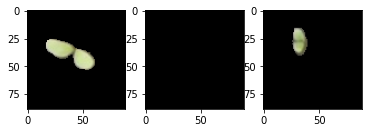

In [ ]:
# plot 3 images 

ix1 = random.randint(0, len(X)-1)
plt.subplot(131)
plt.imshow(cv2.cvtColor(X[ix1,:,:,:], cv2.COLOR_BGR2RGB))


ix1 = random.randint(0, len(X)-1)
plt.subplot(132)
plt.imshow(cv2.cvtColor(X[ix1,:,:,:], cv2.COLOR_BGR2RGB))


ix1 = random.randint(0, len(X)-1)
plt.subplot(133)
plt.imshow(cv2.cvtColor(X[ix1,:,:,:], cv2.COLOR_BGR2RGB)) 


# show the plot
plt.show()

## READ IMAGES AND LABELS FROM A CONTAINER


In [ ]:
# Loading training data and lables from pickle file
pickle_in = open("X_training.pickle","rb")
X = pickle.load(pickle_in)

pickle_in = open("y_training.pickle","rb")
y = pickle.load(pickle_in)

In [ ]:
# Loading training data and lables from pickle file
pickle_in = open("X_validation.pickle","rb")
x_valid = pickle.load(pickle_in)

pickle_in = open("y_validation.pickle","rb")
y_valid = pickle.load(pickle_in)

## Setting Model Parameters

### Model Creation

#### Define the CNN model

The model consists of four convolution blocks with a max pool layer in each of them.

Then, we have a fully connected layer with 512 units, with a `relu` activation function. The model will output class probabilities for four classes — Soil, FA, OC, and FL — using `softmax`. 

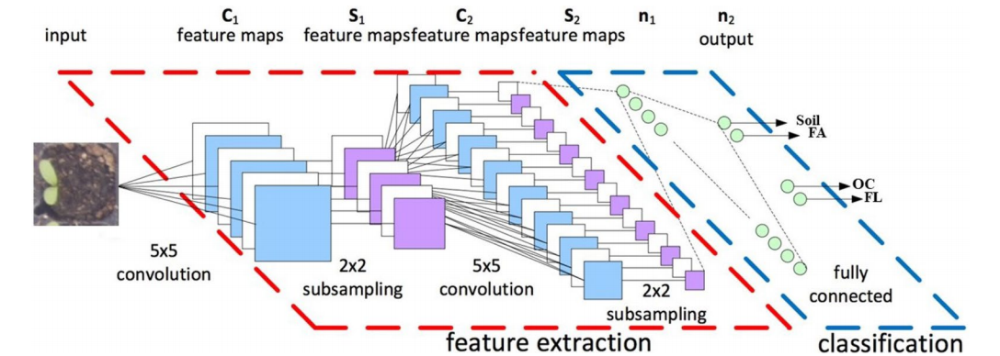


Samiei S, Rasti P, Vu JL, Buitink J, Rousseau D. Deep learning-based detection of seedling development. Plant Methods. 2020 Dec;16(1):1-1.

In [ ]:
modelCNN = Sequential()

modelCNN.add(Conv2D(64, (3, 3),padding='same', input_shape=X.shape[1:]))
modelCNN.add(Activation('relu'))
modelCNN.add(MaxPooling2D(pool_size=(2, 2)))

modelCNN.add(Conv2D(128, (3, 3), padding='same'))
modelCNN.add(Activation('relu'))
modelCNN.add(MaxPooling2D(pool_size=(2, 2)))

modelCNN.add(Conv2D(512, (3, 3), padding='same'))
modelCNN.add(Activation('relu'))
modelCNN.add(MaxPooling2D(pool_size=(2, 2)))

modelCNN.add(Conv2D(512, (3, 3),padding='same'))
modelCNN.add(Activation('relu'))

modelCNN.add(Flatten())

modelCNN.add(Dense(512,activation='relu'))

modelCNN.add(Dense(units=4, activation='softmax'))


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


#### Compiling the model

As usual, we will use the `adam` optimizer. Since we output a softmax categorization, we'll use `sparse_categorical_crossentropy` as the loss function. We would also like to look at training and validation accuracy on each epoch as we train our network, so we are passing in the metrics argument.

In [ ]:
modelCNN.compile(loss='sparse_categorical_crossentropy', 
              optimizer='adam',
              metrics=['accuracy'])

#### Model Summary

Let's look at all the layers of our network using **summary** method.

In [ ]:
modelCNN.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 89, 89, 64)        1792      
_________________________________________________________________
activation (Activation)      (None, 89, 89, 64)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 44, 44, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 44, 44, 128)       73856     
_________________________________________________________________
activation_1 (Activation)    (None, 44, 44, 128)       0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 22, 22, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 512)       5

#### Define the CNN-LSTM model

A CNN is designed to exploit “spatial correlation” in data and works well on individual images, in contrast, an LSTM is usually used to process and make predictions given sequences of data. A combination of these two models can bring both properties in one model,

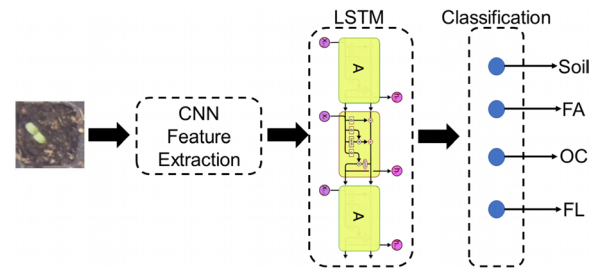

The model consists of three convolution blocks to extract features from images then, we make a sequence of extracted feature to feed them to a LSTM layer as well as a fully connected layer. The model will output class probabilities for four classes — Soil, FA, OC, and FL — using `softmax`. 

In [ ]:
modelCNNLSTM = Sequential()

modelCNNLSTM.add(Conv2D(64, (3, 3),padding='same', input_shape=X.shape[1:]))
modelCNNLSTM.add(Activation('relu'))
modelCNNLSTM.add(MaxPooling2D(pool_size=(2, 2)))

modelCNNLSTM.add(Conv2D(128, (3, 3), padding='same'))
modelCNNLSTM.add(Activation('relu'))
modelCNNLSTM.add(MaxPooling2D(pool_size=(2, 2)))

modelCNNLSTM.add(Conv2D(128, (3, 3),padding='same'))
modelCNNLSTM.add(Activation('relu'))

modelCNNLSTM.add(Flatten())

modelCNNLSTM.add(Lambda(lambda x: tf.expand_dims(modelCNNLSTM.output, axis=-1)))
modelCNNLSTM.add(LSTM(64, return_sequences=False))

modelCNNLSTM.add(Dense(50,activation='relu'))

modelCNNLSTM.add(Dense(units=4, activation='softmax'))


#### Compiling the CNN-LSTM model

we will use the same parameter as the CNN model.

In [ ]:
modelCNNLSTM.compile(loss='sparse_categorical_crossentropy', 
              optimizer='adam',
              metrics=['accuracy'])

#### Model Summary of CNN-LSTM

Let's look at all the layers of our network using **summary** method.

In [ ]:
modelCNNLSTM.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 89, 89, 64)        1792      
_________________________________________________________________
activation_4 (Activation)    (None, 89, 89, 64)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 44, 44, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 44, 44, 128)       73856     
_________________________________________________________________
activation_5 (Activation)    (None, 44, 44, 128)       0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 22, 22, 128)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 22, 22, 128)      

#### Define the TD-CNN-GRU model

The CNN-LSTM model use one CNN model to extract features from each individual image. Instead we can a time distribution in CNN bolck of the model where we use an individual conv layers for images in a sequence.

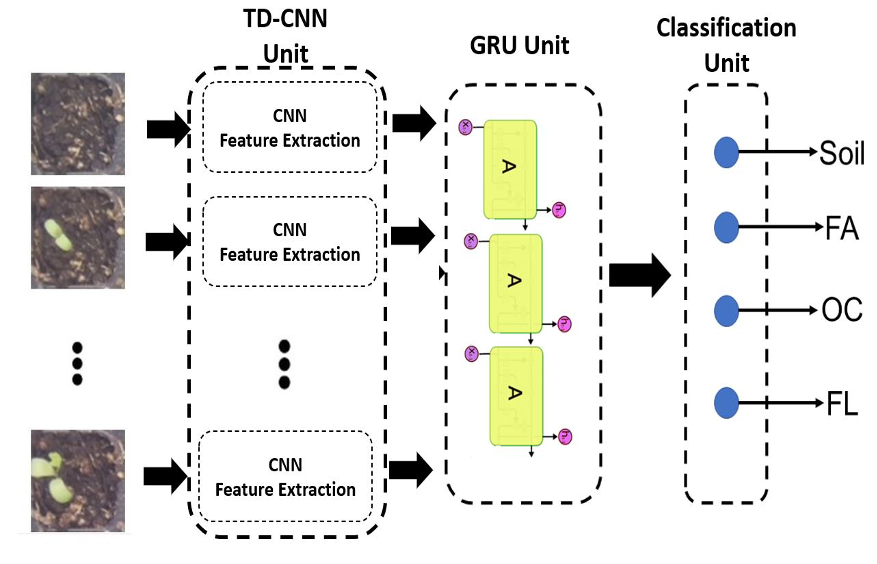


Each CNN model consists of three convolution blocks to extract features from images then, we feed extracted feature a GRU layer as well as a fully connected layer. The model will output class probabilities for four classes — Soil, FA, OC, and FL — using `softmax`. 

In [ ]:
modelGRU = Sequential()

modelGRU.add(
    TimeDistributed(
        Conv2D(64, (3,3), 
            padding='same',  activation='relu'),
        input_shape = (4,89, 89, 3)
    )
)

modelGRU.add(TimeDistributed(MaxPooling2D(pool_size=(2, 2))))

modelGRU.add(TimeDistributed(Conv2D(128, (3, 3), padding='same', activation='relu')))
modelGRU.add(TimeDistributed(MaxPooling2D(pool_size=(2, 2))))

modelGRU.add(TimeDistributed(Conv2D(256, (3, 3),padding='same',activation='relu')))
modelGRU.add(TimeDistributed(MaxPooling2D(pool_size=(2, 2))))
modelGRU.add(BatchNormalization())
modelGRU.add(TimeDistributed(Flatten()))

modelGRU.add(GRU(96))


modelGRU.add(Dense(250,activation='relu'))

modelGRU.add(Dense(4, input_shape=(X_val.shape[1],)))
modelGRU.add(Activation('softmax'))
modelGRU.summary()
modelGRU.compile(loss='sparse_categorical_crossentropy', 
              optimizer='adam',
              metrics=['accuracy'])


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed (TimeDistri (None, 4, 89, 89, 64)     1792      
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 44, 44, 64)     0         
_________________________________________________________________
time_distributed_2 (TimeDist (None, 4, 44, 44, 128)    73856     
_________________________________________________________________
time_distributed_3 (TimeDist (None, 4, 22, 22, 128)    0         
_________________________________________________________________
time_distributed_4 (TimeDist (None, 4, 22, 22, 256)    295168    
_________________________________________________________________
time_distributed_5 (TimeDist (None, 4, 11, 11, 256)    0         
_________________________________________________________________
batch_normalization (BatchNo (None, 4, 11, 11, 256)   

## Train the models

It's time we train our network.

In [ ]:
# saving the log and show it by tensorboard
from tensorboardcolab import TensorBoardColab, TensorBoardColabCallback

tbcCNN=TensorBoardColab()

Using TensorFlow backend.


Wait for 8 seconds...
TensorBoard link:
https://7fa93459df88.ngrok.io


In [ ]:
# Early stop and model check point
early=EarlyStopping(monitor='val_acc',
                              patience=10,
                              verbose=0, mode='max')
checkpointCNN = ModelCheckpoint("CheckPointCNN", monitor='val_acc', verbose=1, save_best_only=True, mode='max')

checkpointCNNLSTM = ModelCheckpoint("CheckPointCNNLSTM.h5", monitor='val_acc', verbose=1, save_best_only=True, mode='max')

checkpointTDCNN = ModelCheckpoint("CheckPointTDCNN.h5", monitor='val_acc', verbose=1, save_best_only=True, mode='max')


In [ ]:
# train the CNN model
modelCNN.fit(
    X, y, 
    validation_data=(X_val, y_val),
    epochs=5, batch_size=32,
    verbose=1,
    shuffle=True,
    callbacks=[TensorBoardColabCallback(tbcCNN), early, checkpointCNN])

Train on 1815 samples, validate on 1488 samples


Epoch 1/5
1760/1815 [============================>.] - ETA: 0s - loss: 3.0043 - acc: 0.9409WARNING:tensorflow:From /usr/local/lib/python3.7/dist-packages/tensorboardcolab/callbacks.py:51: The name tf.Summary is deprecated. Please use tf.compat.v1.Summary instead.


Epoch 00001: val_acc improved from -inf to 0.61425, saving model to CheckPointCNN
1815/1815 [==============================] - 7s 4ms/sample - loss: 2.9134 - acc: 0.9427 - val_loss: 2.9142 - val_acc: 0.6142
Epoch 2/5
1760/1815 [============================>.] - ETA: 0s - loss: 0.0270 - acc: 0.9955
Epoch 00002: val_acc improved from 0.61425 to 0.69086, saving model to CheckPointCNN
1815/1815 [==============================] - 4s 2ms/sample - loss: 0.0262 - acc: 0.9956 - val_loss: 2.4345 - val_acc: 0.6909
Epoch 3/5
1760/1815 [============================>.] - ETA: 0s - loss: 0.0179 - acc: 0.9949
Epoch 00003: val_acc improved from 0.69086 to 0.69624, saving model to CheckPointCN

In [ ]:
# train the CNN-LSTM
modelCNNLSTM.fit(
    X, y, 
    validation_data=(X_val, y_val),
    epochs=1, batch_size=32,
    verbose=1,
    callbacks=[TensorBoardColabCallback(tbcCNN), early, checkpointCNNLSTM])

In [ ]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
train_sequences = TimeseriesGenerator(X, y, length=4, batch_size=32)
test_sequences = TimeseriesGenerator(X_val, y_val, length=4, batch_size=32)

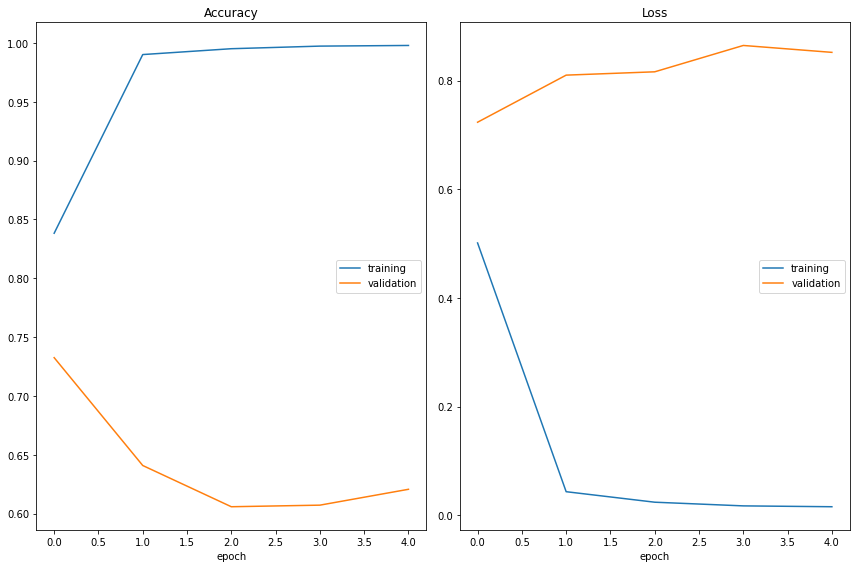

Accuracy
	training         	 (min:    0.838, max:    0.998, cur:    0.998)
	validation       	 (min:    0.606, max:    0.732, cur:    0.621)
Loss
	training         	 (min:    0.016, max:    0.501, cur:    0.016)
	validation       	 (min:    0.723, max:    0.865, cur:    0.852)
57/57 [==============================] - 8s 133ms/step - loss: 0.0156 - acc: 0.9978 - val_loss: 0.8521 - val_acc: 0.6206


In [ ]:
plotlossesGRU = PlotLossesKeras()
modelGRU.fit_generator(train_sequences,validation_data = test_sequences,epochs=5,callbacks=[plotlossesGRU, early, checkpointCNN])

###Load trained Model###

The model can be loaded via the load_model() function.

In [ ]:
# load model
modelCNN = load_model('CheckPointCNN')

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Evaluation on the loaded model on test data

In [ ]:
modelCNN.evaluate(X_val,y_val)

1488/1488 [==============================] - 1s 463us/sample - loss: 1.8868 - acc: 0.7298


[1.8867648971068989, 0.7298387]

In [ ]:
modelCNN.predict_classes(X_val)

array([0, 0, 0, ..., 3, 0, 3])